In [113]:
import pandas as pd

# Function to load and prepare data from a specified file, sheet, and columns
def load_and_prepare(base_path, year, file_name, sheet_name, columns):
    file_path = f"{base_path}{year}/{file_name}"
    print(f"Loading data from {file_path}")
    print(f"Sheet name: {sheet_name}")
    print(f"Columns: {columns}")
    
    # Load the data and remove any whitespace from column names
    df = pd.read_excel(file_path, sheet_name=sheet_name, usecols=columns)
    df.columns = df.columns.str.strip()
    
    # Add the 'time' column using the add_time_column function
    df = add_time_column(df, year)
    
    print(f"Loaded {sheet_name} data from {file_name} for year {year}")
    print(df.head())
    return df

# Function to add a 'time' column based on the provided year
def add_time_column(df, year):
    df['time'] = year
    return df

# Define base path and year
base_path = 'EIA860_20-23/eia860'  
year = '2020'  # Change this to load data for different years

# Load data for each sheet and file
utility_data = load_and_prepare(base_path, year, '1_Utility.xlsx', 'Utility', 
                                ['Utility ID', 'Utility Name', 'Street Address', 'City', 'State', 'Zip', 'Entity Type'])

plant_data = load_and_prepare(base_path, year, '2_Plant.xlsx', 'Plant', 
                              ['Utility ID', 'Utility Name', 'Plant Code', 'Plant Name', 'State', 'Zip', 'County', 
                               'Latitude', 'Longitude', 'NERC Region', 'Sector', 'Sector Name', 'FERC Cogeneration Status', 
                               'FERC Cogeneration Docket Number', 'FERC Small Power Producer Status', 
                               'FERC Small Power Producer Docket Number', 'FERC Exempt Wholesale Generator Status', 
                               'FERC Exempt Wholesale Generator Docket Number'])

generator_data = load_and_prepare(base_path, year, '3_1_Generator.xlsx', 'Operable', 
                                  ['Utility ID', 'Utility Name', 'Plant Code', 'Plant Name', 'State', 'County', 
                                   'Generator ID', 'Technology', 'Prime Mover', 'Unit Code', 'Ownership', 
                                   'Nameplate Capacity (MW)', 'Nameplate Power Factor', 'Summer Capacity (MW)', 
                                   'Winter Capacity (MW)', 'Minimum Load (MW)', 'Status', 'Synchronized to Transmission Grid', 
                                   'Operating Month', 'Operating Year', 'Sector Name', 'Sector'])

wind_data = load_and_prepare(base_path, year, '3_2_Wind.xlsx', 'Operable', 
                             ['Plant Code', 'Generator ID', 'Number of Turbines', 'Predominant Turbine Manufacturer', 
                              'Predominant Turbine Model Number', 'Design Wind Speed (mph)', 'Wind Quality Class', 
                              'Turbine Hub Height (Feet)'])

solar_data = load_and_prepare(base_path, year, '3_3_Solar.xlsx', 'Operable', 
                              ['Plant Code', 'Generator ID', 'Net Metering Agreement?', 'Net Metering DC Capacity (MW)', 
                               'Virtual Net Metering Agreement?', 'Virtual Net Metering DC Capacity (MW)'])

energy_storage_data = load_and_prepare(base_path, year, '3_4_Energy_Storage.xlsx', 'Operable', 
                                       ['Plant Name', 'Generator ID', 'Technology', 'Nameplate Energy Capacity (MWh)', 
                                        'Maximum Charge Rate (MW)', 'Maximum Discharge Rate (MW)', 'Storage Technology 1', 
                                        'Nameplate Reactive Power Rating', 'Storage Enclosure Type', 'Arbitrage', 
                                        'Excess Wind and Solar Generation'])

owner_data = load_and_prepare(base_path, year, '4_Owner.xlsx', 'Ownership', 
                              ['Utility ID', 'Generator ID', 'Owner City', 'Owner State', 'Owner Zip', 'Ownership ID', 
                               'Percent Owned'])


Loading data from EIA860_20-23/eia8602020/1_Utility.xlsx
Sheet name: Utility
Columns: ['Utility ID', 'Utility Name', 'Street Address', 'City', 'State', 'Zip', 'Entity Type']


RecursionError: maximum recursion depth exceeded

In [112]:
def open_with_year_suffix(file, mode='r', *args, **kwargs):
    """
    仅在特定保存文件调用时使用，用于添加年份戳。
    """
    if 'w' in mode or 'a' in mode or 'x' in mode:
        dir_name, filename = os.path.split(file)
        name_part, extension = os.path.splitext(filename)
        year_suffix = f"({datetime.now().year})印"
        new_filename = f"{name_part}_{year_suffix}{extension}"
        file = os.path.join(dir_name, new_filename)

    return open(file, mode, *args, **kwargs)

In [98]:
import pandas as pd
import sqlite3

# Function to save multiple DataFrames to a SQLite database
def save_to_database(data_frames, db_name):
    conn = sqlite3.connect(db_name)
    print(f"Connected to {db_name} database.")
    
    # Save each DataFrame to the database
    for table_name, df in data_frames.items():
        df.to_sql(table_name, conn, if_exists='replace', index=False)
        print(f"Saved '{table_name}' table to the database.")
    
    # Verify tables saved in the database
    tables = pd.read_sql("SELECT name FROM sqlite_master WHERE type='table';", conn)
    print("Tables in the database:")
    print(tables)
    
    # Close the connection
    conn.close()
    print("Database connection closed.")

# Function to filter renewable energy data from the database
def filter_renewable_data(db_name, renewable_tech, output_csv_name='filtered_renewable_data.csv'):
    conn = sqlite3.connect(db_name)
    print(f"Connected to {db_name} database for filtering.")

    # Filter renewable energy data from the `generator` table
    query_filter = """
        SELECT * FROM generator 
        WHERE Technology IN ({})
    """.format(', '.join(f"'{tech}'" for tech in renewable_tech))

    renewable_data = pd.read_sql(query_filter, conn)
    print("Filtered renewable energy data:")
    print(renewable_data.head())

    # Save filtered renewable data to a CSV
    renewable_data.to_csv(output_csv_name, index=False)
    print(f"Filtered renewable data saved to '{output_csv_name}'.")

    # Close the database connection
    conn.close()
    print("Database connection closed.")
    return renewable_data


# 
#  usage

# Define data_frames dictionary
data_frames = {
    "utility": utility_data,
    "plant": plant_data,
    "generator": generator_data,
    "wind": wind_data,
    "solar": solar_data,
    "energy_storage": energy_storage_data,
    "owner": owner_data
}

# Define renewable technologies for filtering
renewable_tech = ["Onshore Wind Turbine", "Offshore Wind Turbine", "Solar Photovoltaic", 
                  "Solar Thermal with Energy Storage", "Solar Thermal without Energy Storage", "Batteries"]

# Call the save function
save_to_database(data_frames, 'energy_data_{year}.db')

# Call the filter function
filtered_data = filter_renewable_data('energy_data_{year}.db', renewable_tech, f'filtered_renewable_data_{year}.csv')


Connected to energy_data.db database.
Saved 'utility' table to the database.
Saved 'plant' table to the database.
Saved 'generator' table to the database.
Saved 'wind' table to the database.
Saved 'solar' table to the database.
Saved 'energy_storage' table to the database.
Saved 'owner' table to the database.
Tables in the database:
             name
0         utility
1           plant
2       generator
3            wind
4           solar
5  energy_storage
6           owner
Database connection closed.
Connected to energy_data.db database for filtering.
Filtered renewable energy data:
  Utility ID                    Utility Name  Plant Code   Plant Name State  \
0      63560  TDX Sand Point Generating, LLC         1.0   Sand Point    AK   
1      63560  TDX Sand Point Generating, LLC         1.0   Sand Point    AK   
2      13642      Nome Joint Utility Systems        90.0  Snake River    AK   
3      13642      Nome Joint Utility Systems        90.0  Snake River    AK   
4      13642  

In [116]:
import os
import sqlite3
import pandas as pd

# Function to get columns of a table
def get_table_columns(conn, table_name):
    """
    获取指定表的列名列表
    """
    query = f"PRAGMA table_info({table_name})"
    result = pd.read_sql(query, conn)
    return result['name'].tolist()

# Function to perform a combined lookup in a single table based on available fields
def match_data(conn, table_name, match_fields, match_values):
    """
    在指定表中查询匹配行，基于提供的字段和值。
    """
    # 根据匹配字段动态构建查询条件
    conditions = " AND ".join([f'"{field}" = ?' for field in match_fields])
    query = f'SELECT * FROM "{table_name}" WHERE {conditions}'

    # 调试输出：打印查询语句和参数
    print(f"查询 {table_name} 表，条件: {conditions}")
    print(f"查询参数: {match_values}")
    
    # 执行查询并返回结果
    return pd.read_sql(query, conn, params=match_values)

# Function to match filtered data against multiple tables
def match_multiple_tables(db_name, filtered_data, target_tables, output_folder=f'matched_data_{year}'):
    """
    在SQLite数据库的多个表中匹配 `filtered_data` 数据，并将结果保存为CSV文件。
    """
    # 确保输出文件夹存在
    os.makedirs(output_folder, exist_ok=True)

    with sqlite3.connect(db_name) as conn:
        for table_name in target_tables:
            matches = []  # 存储每个表中的匹配行

            # 获取目标表的列信息
            table_columns = get_table_columns(conn, table_name)
            print(f"{table_name} 表的字段列表: {table_columns}")
            
            for _, row in filtered_data.iterrows():
                print("处理行:")
                print(row)
                
                # 确定当前行中可用的匹配字段
                match_fields = []
                match_values = []
                
                # 根据实际存在的列来构建匹配条件
                if "Utility ID" in table_columns and not pd.isna(row.get("Utility ID")):
                    match_fields.append("Utility ID")
                    match_values.append(row["Utility ID"])
                if "Plant Code" in table_columns and not pd.isna(row.get("Plant Code")):
                    match_fields.append("Plant Code")
                    match_values.append(row["Plant Code"])
                if "Generator ID" in table_columns and not pd.isna(row.get("Generator ID")):
                    match_fields.append("Generator ID")
                    match_values.append(row["Generator ID"])
                
                # 仅当存在匹配字段时执行查询
                if match_fields:
                    matched_rows = match_data(conn, table_name, match_fields, match_values)
                    matches.append(matched_rows)
            
            # 合并每个表中的匹配结果
            matched_data = pd.concat(matches, ignore_index=True) if matches else pd.DataFrame()
            print(f"{table_name} 表中的匹配数据:")
            print(matched_data.head())
            
            # 将结果保存为CSV文件
            output_path = f"{output_folder}/{table_name}_matched_data_{year}.csv"
            matched_data.to_csv(output_path, index=False)
            print(f"匹配结果已保存至: {output_path}")

# 示例用法
# 假设 `filtered_data` 是从可再生能源数据中筛选后的DataFrame
target_tables = ["utility", "plant", "generator", "wind", "solar", "energy_storage", "owner"]
match_multiple_tables(f'energy_data_{year}.db', filtered_data, target_tables)


utility 表的字段列表: ['Utility ID', 'Utility Name', 'Street Address', 'City', 'State', 'Zip', 'Entity Type', 'time']
处理行:
Utility ID                                                    63560
Utility Name                         TDX Sand Point Generating, LLC
Plant Code                                                      1.0
Plant Name                                               Sand Point
State                                                            AK
County                                               Aleutians East
Generator ID                                                    WT1
Technology                                     Onshore Wind Turbine
Prime Mover                                                      WT
Unit Code                                                      None
Ownership                                                         S
Nameplate Capacity (MW)                                         0.5
Nameplate Power Factor                                         0.89

RecursionError: maximum recursion depth exceeded while calling a Python object

Loaded file plant_matched_data.csv into table Plant.
Loaded file wind_matched_data.csv into table Wind.
Loaded file energy_storage_matched_data.csv into table Energy Storage.
Loaded file utility_matched_data.csv into table Utility.
Loaded file generator_matched_data.csv into table Generator.
Loaded file solar_matched_data.csv into table Solar.
Loaded file owner_matched_data.csv into table Owner.
Columns that appear in multiple tables:
     Column Name                                             Tables
6         county                                   Plant, Generator
10  generator id      Wind, Solar, Energy Storage, Generator, Owner
2     plant code                      Solar, Plant, Wind, Generator
3     plant name                   Plant, Energy Storage, Generator
7         sector                                   Plant, Generator
8    sector name                                   Plant, Generator
4          state                          Utility, Plant, Generator
11    technology 

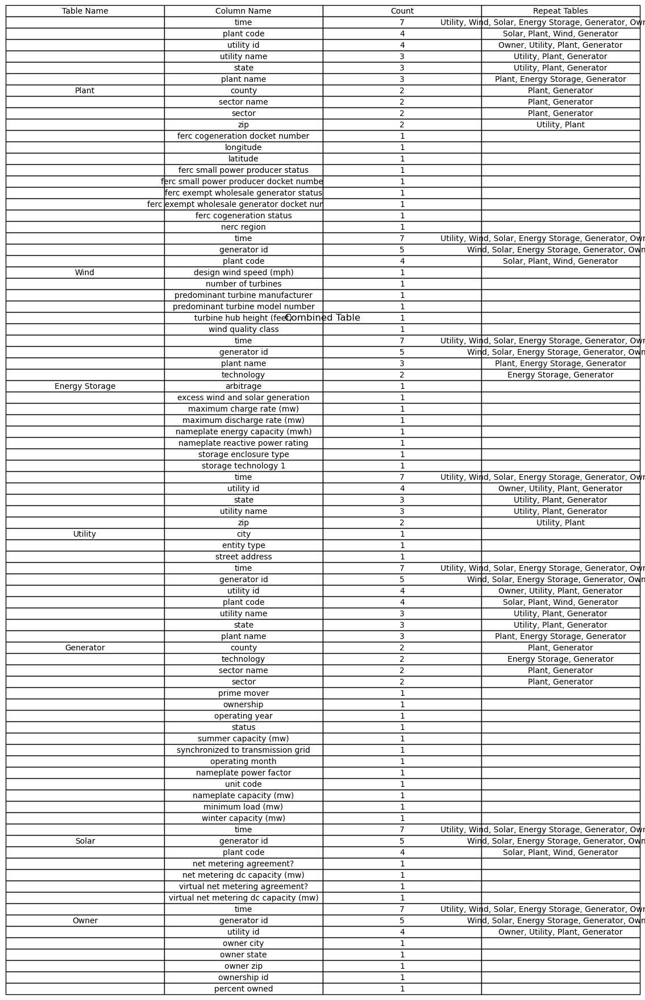

In [97]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def load_matched_data(folder='matched_data'):
    """
    Load matched data from the specified folder.
    """
    dataframes = {}
    for file_name in os.listdir(folder):
        if file_name.endswith('.csv'):
            table_name = os.path.splitext(file_name)[0]
            # Simplify table name
            table_name = table_name.replace('_matched_data', '').replace('_', ' ').title()
            df = pd.read_csv(os.path.join(folder, file_name))
            dataframes[table_name] = df
            print(f"Loaded file {file_name} into table {table_name}.")
    return dataframes


def list_and_count_columns_for_table(table_name, df, all_columns):
    """
    List each column of a single table and count the occurrences of each column name across all tables.
    """
    columns = df.columns.str.lower().str.strip().tolist()  # Standardize column names
    column_counts = pd.Series(all_columns).value_counts().to_dict()
    
    summary = []
    for col in columns:
        summary.append({'Table Name': table_name, 'Column Name': col, 'Count': column_counts[col]})
    
    summary_df = pd.DataFrame(summary)
    summary_df = summary_df.sort_values(by=['Table Name', 'Column Name'])  # Sort by table name and column name
    
    return summary_df

def frame_adjustment(summary_df):
    """
    Merge duplicate table names and sort by count in descending order.
    """
    # Merge duplicate table names
    summary_df['Table Name'] = summary_df['Table Name'].where(summary_df['Table Name'].ne(summary_df['Table Name'].shift()), '')
    
    # Sort by count in descending order
    summary_df = summary_df.sort_values(by='Count', ascending=False)
    
    return summary_df

def repeat_table(dataframes):
    """
    List which column names appear in multiple tables and add a column to the original table showing these duplicate table names.
    """
    column_table_map = {}
    
    for table_name, df in dataframes.items():
        columns = df.columns.str.lower().str.strip().tolist()  # Standardize column names
        
        for col in columns:
            if col in column_table_map:
                column_table_map[col].add(table_name)
            else:
                column_table_map[col] = {table_name}
    
    repeat_summary = []
    for col, tables in column_table_map.items():
        if len(tables) > 1:
            repeat_summary.append({'Column Name': col, 'Tables': ', '.join(tables)})
    
    repeat_df = pd.DataFrame(repeat_summary)
    repeat_df = repeat_df.sort_values(by='Column Name')  # Sort by column name
    
    return repeat_df

def add_repeat_tables_column(summary_df, repeat_df):
    """
    Add a column to the original table showing duplicate table names.
    """
    repeat_dict = repeat_df.set_index('Column Name')['Tables'].to_dict()
    summary_df['Repeat Tables'] = summary_df['Column Name'].map(repeat_dict).fillna('')
    return summary_df

def generate_summary_image(summary_df, title="Column Summary"):
    """
    Generate an image showing table names, column names, and column occurrence counts, and display it in a Jupyter Notebook.
    """
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis('tight')
    ax.axis('off')
    table = ax.table(cellText=summary_df.values, colLabels=summary_df.columns, cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 1.2)
    plt.title(title)
    plt.show()

def combination(all_summaries):
    """
    Combine all tables into one and display.
    """
    combined_df = pd.concat(all_summaries, ignore_index=True)
    return combined_df

# Example usage
matched_data = load_matched_data(folder='matched_data')

# Collect all column names
all_columns = []
for df in matched_data.values():
    columns = df.columns.str.lower().str.strip().tolist()  # Standardize column names
    all_columns.extend(columns)

# List which column names appear in multiple tables
repeat_df = repeat_table(matched_data)
print("Columns that appear in multiple tables:")
print(repeat_df)

# Store summaries of all tables
all_summaries = []

# For each table, list columns, count occurrences, and mark duplicates
for table_name, df in matched_data.items():
    summary_df = list_and_count_columns_for_table(table_name, df, all_columns)
    print(f"Column summary for table {table_name}:")
    print(summary_df)
    
    # Adjust table names and sort by count
    adjusted_summary_df = frame_adjustment(summary_df)
    print(f"Adjusted column summary for table {table_name}:")
    print(adjusted_summary_df)
    
    # Add a column showing duplicate table names
    final_summary_df = add_repeat_tables_column(adjusted_summary_df, repeat_df)
    print(f"Final column summary for table {table_name}:")
    print(final_summary_df)
    
    # Store summary
    all_summaries.append(final_summary_df)
    

# Combine all tables into one and display
combined_df = combination(all_summaries)

# Print combined table
print("Combined table:")
print(combined_df)

# Generate an image of the combined table
generate_summary_image(combined_df, title="Combined Table")

In [110]:
import builtins


builtins.open = original_open # type: ignore